<h1>Music Genre Classification Using Convolutional Neural Networks (CNNs) on Audio Data<h1>


---



<h2>1. Environment Setup<h2>

In [1]:
import os
import librosa
import matplotlib.pyplot as plt
import tensorflow as tf
import numpy as np
from IPython.display import Audio
import warnings
from skimage.transform import resize
from tensorflow.keras.layers import Conv2D,MaxPool2D,Flatten,Dense,Dropout
from tensorflow.keras.optimizers import Adam

<h2>2. Audio File Visualization<h2>

In [2]:
random_file_name = r"C:/Users/nadiv/Downloads/GTZAN/pop.00069.wav"

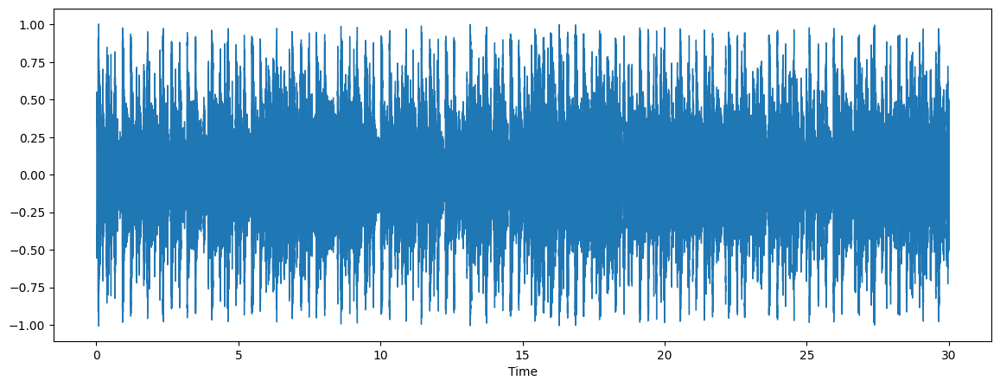

In [3]:
y,sr = librosa.load(random_file_name,sr=44100)
plt.figure(figsize=(14,5))
librosa.display.waveshow(y,sr=sr)

In [4]:
Audio(data=y,rate=sr)

<h2>3. Splitting Audio into Overlapping Chunks<h2>

This section splits the audio file into 4-second chunks with 2-second overlap between them. Each chunk is then visualized to inspect the segmentation.

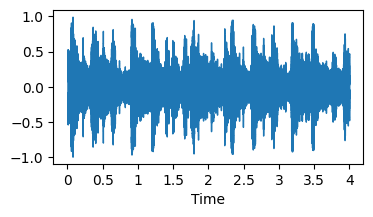

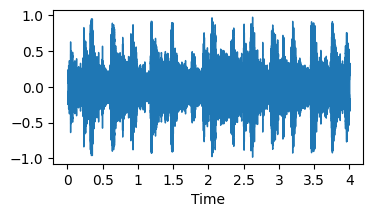

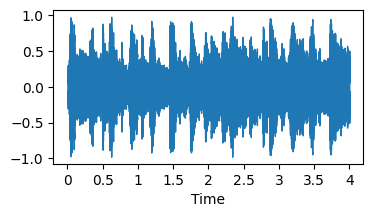

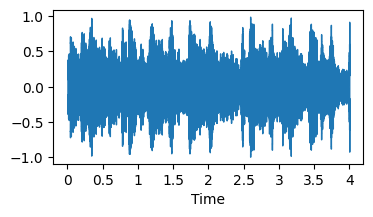

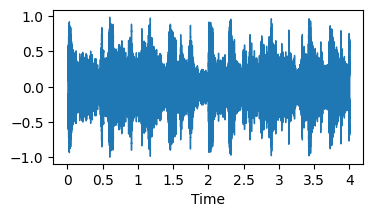

...

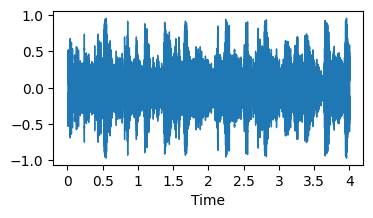

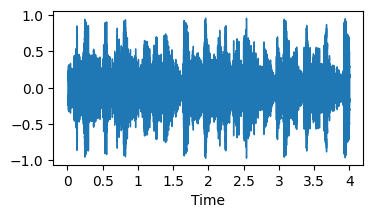

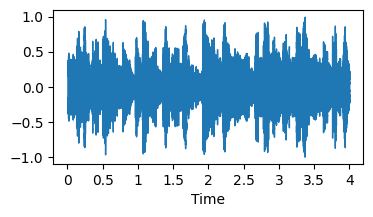

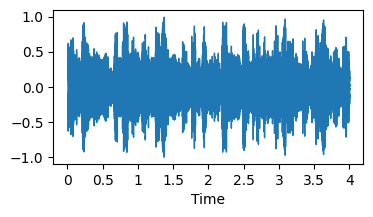

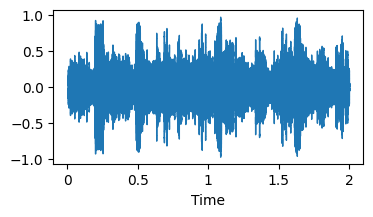

In [5]:
audio_path = random_file_name
y, sr = librosa.load(audio_path, sr=None)
chunk_duration = 4
overlap_duration = 2
chunk_samples = chunk_duration * sr
overlap_samples = overlap_duration * sr
num_chunks = int(np.ceil((len(y) - chunk_samples) / (chunk_samples - overlap_samples))) + 1
for i in range(num_chunks):
    start = i * (chunk_samples - overlap_samples)
    end = start + chunk_samples
    chunk = y[start:end]
    plt.figure(figsize=(4, 2))
    librosa.display.waveshow(chunk, sr=sr)
    plt.show()

<h2>4. Visualizing Mel Spectrograms of the Entire Audio and Chunks<h2>



In this section, we first compute and plot the mel spectrogram for the entire audio file.
Then, we split the audio into overlapping 4-second chunks and plot the mel spectrogram for each chunk individually to better analyze local features.

In [6]:
def plot_melespectrogram(y,sr):
    spectrogram = librosa.feature.melspectrogram(y=y,sr=sr)
    spectrogram_db = librosa.power_to_db(spectrogram,ref=np.max)
    plt.figure(figsize=(10,4))
    librosa.display.specshow(spectrogram_db,sr=sr,x_axis='time',y_axis='mel')
    plt.colorbar(format='%2.0f dB')
    plt.title("Spectrogram")
    plt.tight_layout()
    plt.show()

In [7]:
y,sr = librosa.load(random_file_name,sr=44100)

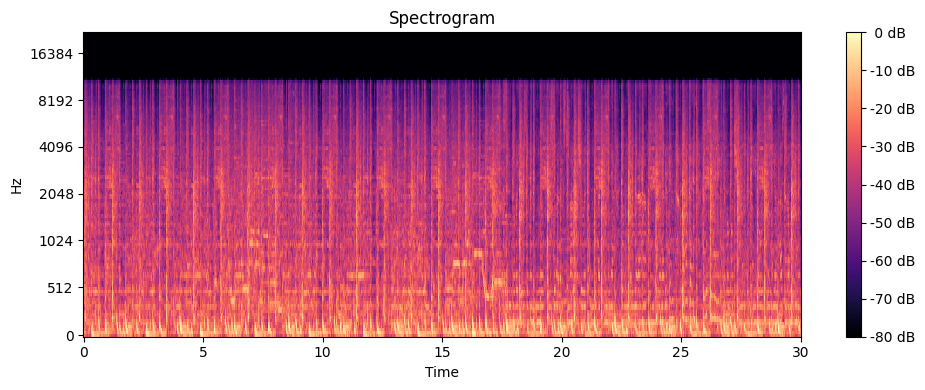

In [8]:
plot_melespectrogram(y,sr)

In [9]:
def plot_melspectrogram_chunks(y,sr):
    chunk_duration = 4
    overlap_duration = 2
    chunk_samples = chunk_duration * sr
    overlap_samples = overlap_duration * sr
    num_chunks = int(np.ceil((len(y)-chunk_samples)/(chunk_samples-overlap_samples)))+1
    for i in range(num_chunks):
        start = i*(chunk_samples-overlap_samples)
        end = start+chunk_samples
        chunk = y[start:end]
        spectrogram = librosa.feature.melspectrogram(y=chunk,sr=sr)
        print(spectrogram.shape)
        spectrogram_db = librosa.power_to_db(spectrogram,ref=np.max)
        plt.figure(figsize=(10,4))
        librosa.display.specshow(spectrogram_db,sr=sr,x_axis='time',y_axis='mel')
        plt.colorbar(format='%2.0f dB')
        plt.title("Spectrogram")
        plt.tight_layout()
        plt.show()

(128, 345)


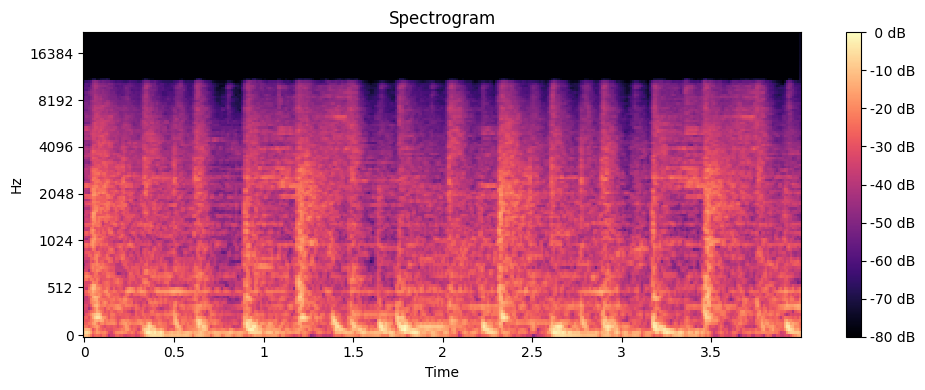

(128, 345)


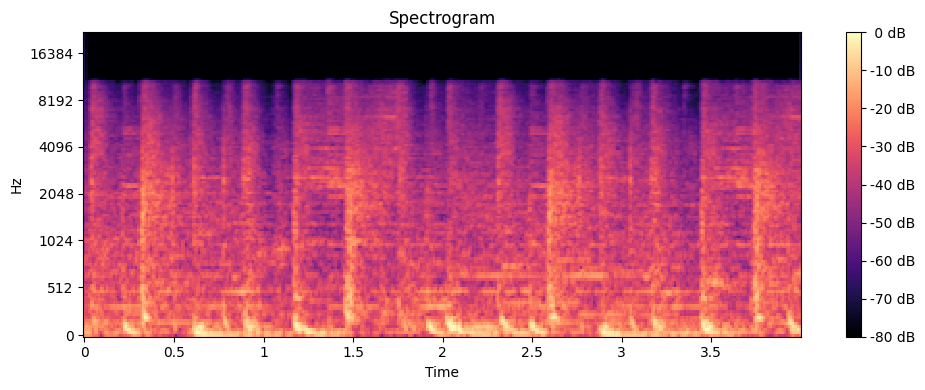

(128, 345)


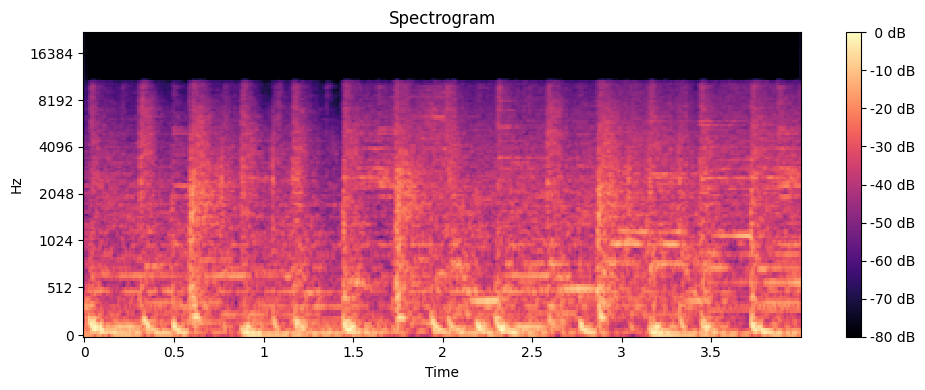

(128, 345)


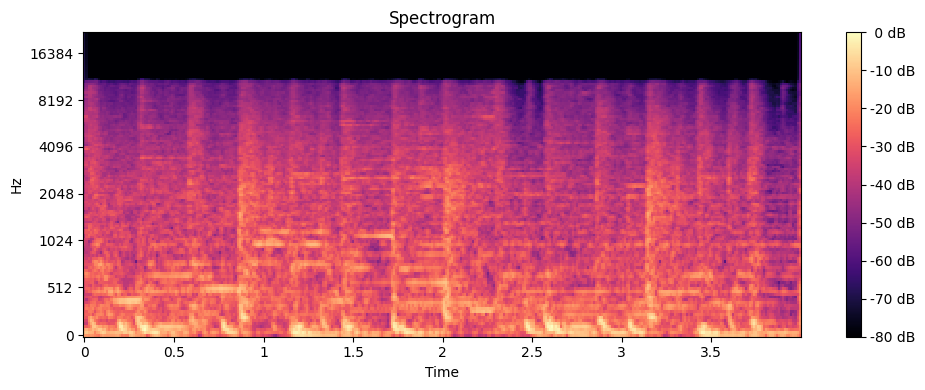

(128, 345)


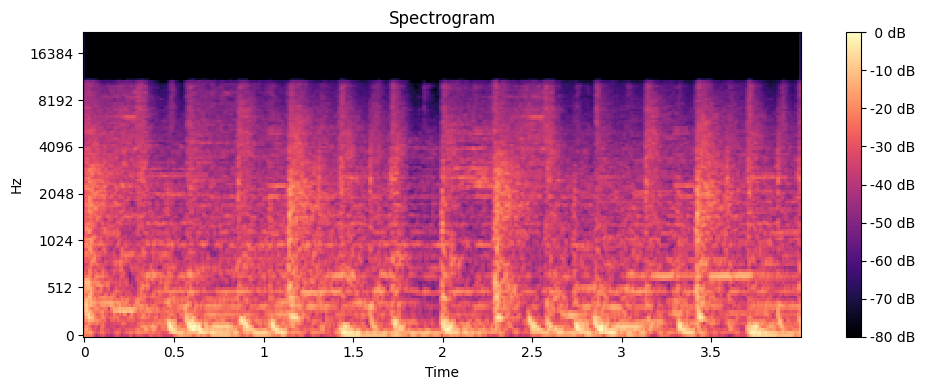

(128, 345)


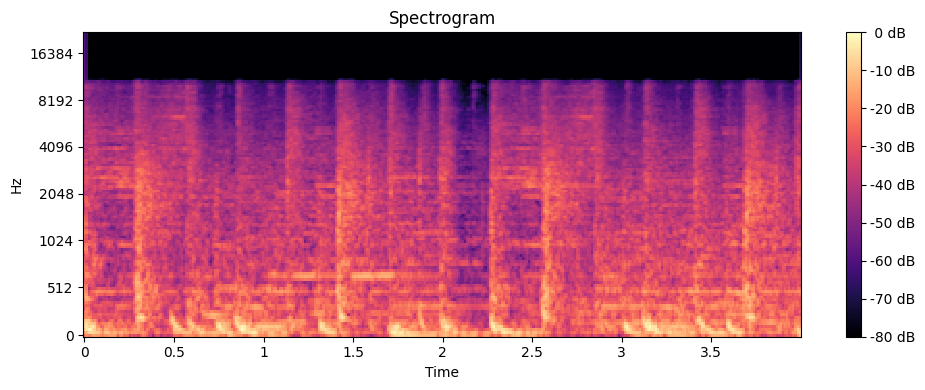

(128, 345)


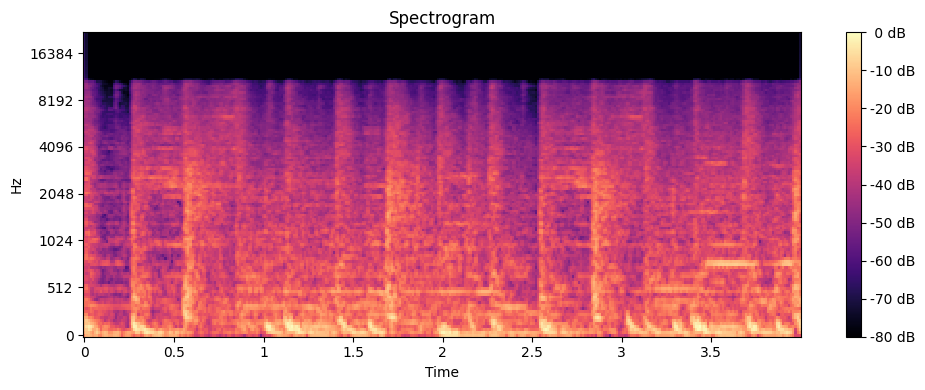

(128, 345)


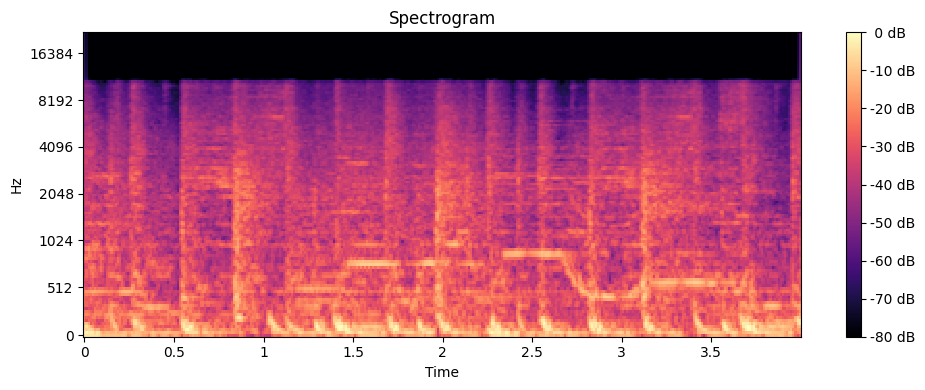

(128, 345)


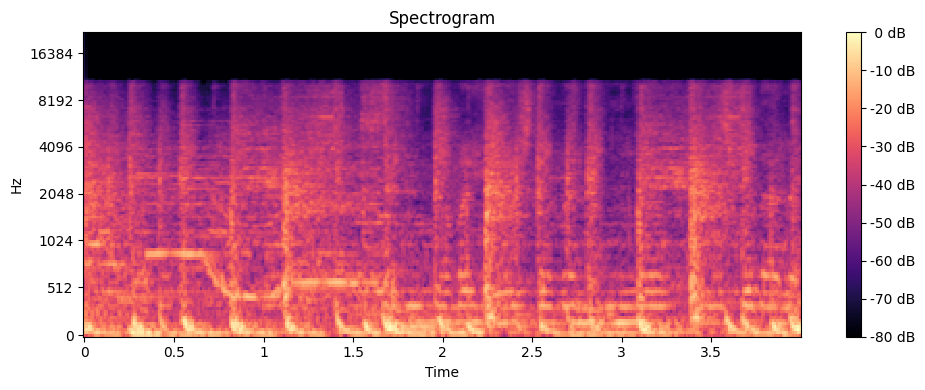

(128, 345)


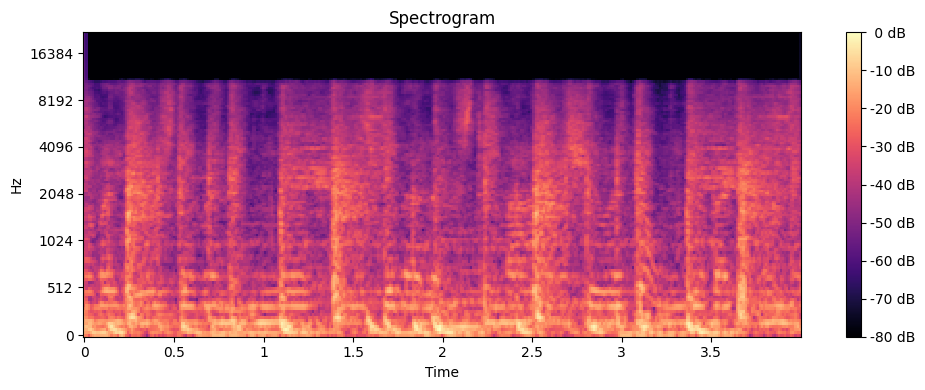

(128, 345)


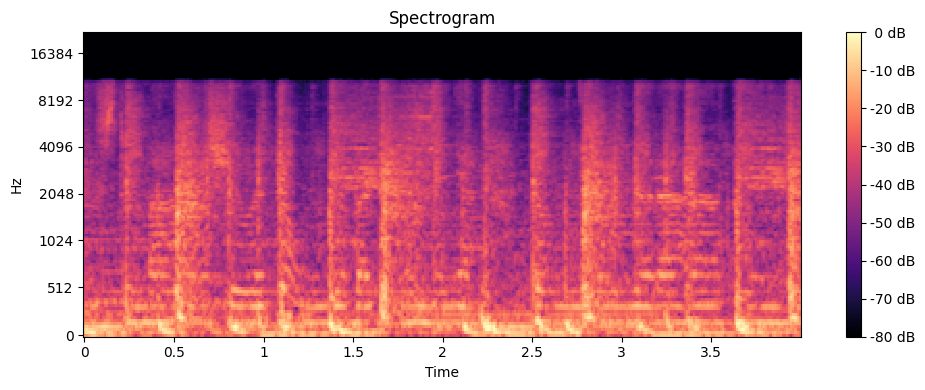

(128, 345)


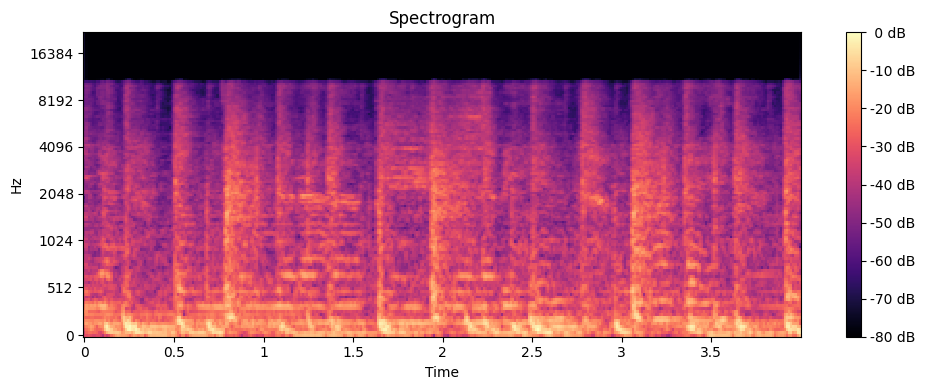

(128, 345)


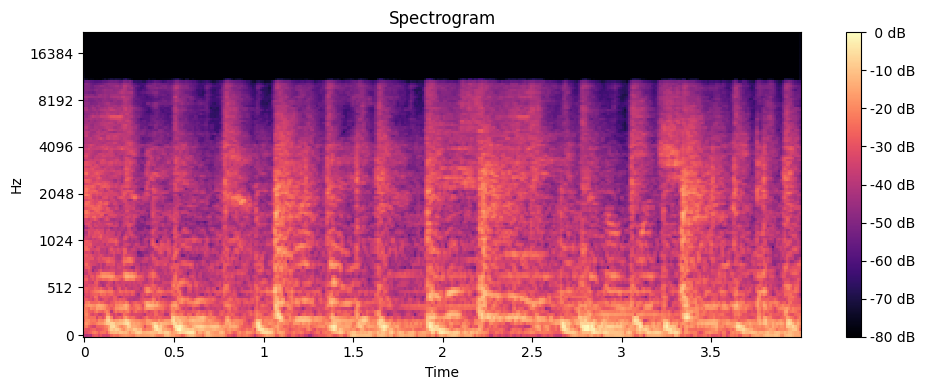

(128, 345)


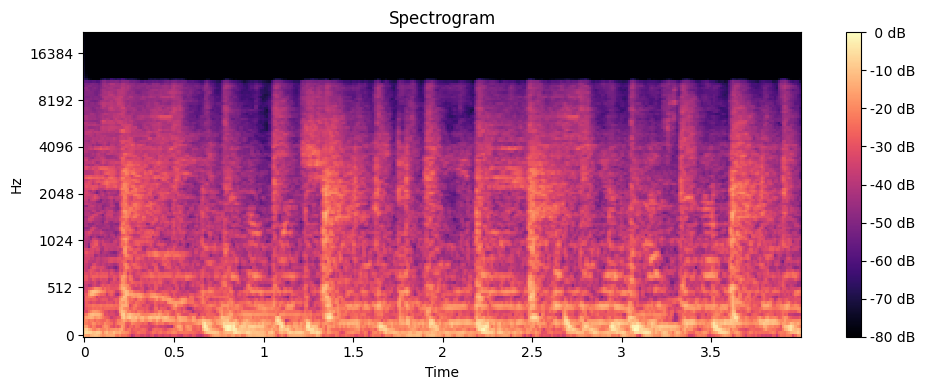

(128, 173)


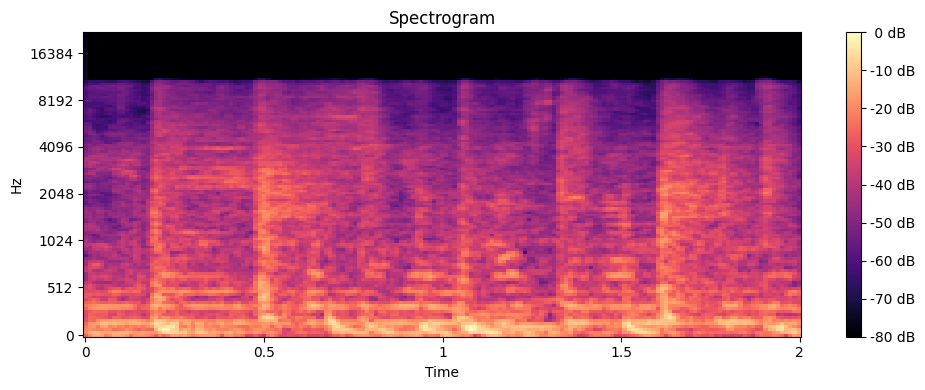

In [10]:
plot_melspectrogram_chunks(y,sr)

<h2>5. Loading and Preprocessing the GTZAN Dataset<h2>

We define a function to load audio files from the GTZAN dataset, split each file into overlapping 4-second chunks, compute the mel spectrograms for these chunks, resize them to a uniform shape (150×150), and assign the corresponding labels.
Finally, the dataset is split into training and testing sets using an 80/20 ratio.

In [11]:
data_dir = r'C:\Users\nadiv\Downloads\GTZAN\genres_original'
classes = ['blues', 'classical','country','disco','hiphop','jazz','metal','pop','reggae','rock']

In [12]:
def load_and_preprocess_data(data_dir, classes, target_shape=(150,150)):
    data = []
    labels = []
    for i_class, class_name in enumerate(classes):
        class_dir = os.path.join(data_dir, class_name)
        print("Processing ---", class_name)
        for filename in os.listdir(class_dir):
            if filename.endswith('.wav'):
                file_path = os.path.join(class_dir, filename)
                try:
                    audio_data, sample_rate = librosa.load(file_path, sr=None)
                except Exception as e:
                    warnings.warn(f"Error loading {file_path}: {e}")
                    continue
                chunk_duration = 4
                overlap_duration = 2
                chunk_samples = chunk_duration * sample_rate
                overlap_samples = overlap_duration * sample_rate
                num_chunks = int(np.ceil((len(audio_data) - chunk_samples) / (chunk_samples - overlap_samples))) + 1
                for i in range(num_chunks):
                    start = i * (chunk_samples - overlap_samples)
                    end = start + chunk_samples
                    chunk = audio_data[start:end]
                    mel_spectrogram = librosa.feature.melspectrogram(y=chunk, sr=sample_rate)
                    mel_spectrogram = resize(np.expand_dims(mel_spectrogram, axis=-1), target_shape, preserve_range=True)
                    data.append(mel_spectrogram)
                    labels.append(i_class)
    return np.array(data), np.array(labels)

In [13]:
data,labels = load_and_preprocess_data(data_dir,classes)

Processing --- blues
Processing --- classical
Processing --- country
Processing --- disco
Processing --- hiphop
Processing --- jazz


C:\Users\nadiv\AppData\Local\Temp\ipykernel_21636\1852534831.py:11: UserWarning: PySoundFile failed. Trying audioread instead.
  audio_data, sample_rate = librosa.load(file_path, sr=None)
C:\Users\nadiv\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\librosa\core\audio.py:184: FutureWarning: librosa.core.audio.__audioread_load
	Deprecated as of librosa version 0.10.0.
	It will be removed in librosa version 1.0.
  y, sr_native = __audioread_load(path, offset, duration, dtype)
C:\Users\nadiv\AppData\Local\Temp\ipykernel_21636\1852534831.py:13: UserWarning: Error loading C:\Users\nadiv\Downloads\GTZAN\genres_original\jazz\jazz.00054.wav: 
  warnings.warn(f"Error loading {file_path}: {e}")


Processing --- metal
Processing --- pop
Processing --- reggae
Processing --- rock


In [88]:
from sklearn.model_selection import train_test_split
X_train,X_test,Y_train,Y_test = train_test_split(data,labels,test_size=0.2,random_state=42)

In [89]:
print("X_train shape:", X_train.shape)
print("Y_train shape:", Y_train.shape)
print("X_test shape:", X_test.shape)
print("Y_test shape:", Y_test.shape)

X_train shape: (11980, 150, 150, 1)
Y_train shape: (11980,)
X_test shape: (2995, 150, 150, 1)
Y_test shape: (2995,)


<h2>6. Building and Training the Convolutional Neural Network (CNN)<h2>

Description:
We design a deep Convolutional Neural Network (CNN) architecture tailored for classifying music genres based on mel spectrogram images. The model structure is as follows:


---


Input Layer:
Receives preprocessed mel spectrograms of shape (150, 150, 1).


---


Convolutional Blocks:
Five convolutional blocks, each consisting of two Conv2D layers (with ReLU activation), followed by a MaxPooling2D layer to progressively reduce the spatial dimensions.
The number of filters increases at each block: 32 → 64 → 128 → 256 → 512.


---


Dropout Layers:
Dropout is applied after the third and fifth convolutional blocks to prevent overfitting, with dropout rates of 30% and 30% respectively.


---


Flatten Layer:
Converts the feature maps into a 1D vector.


---


Dense Layers:
A fully connected (Dense) layer with 1200 units and ReLU activation, followed by another Dropout layer with a 45% rate to further reduce overfitting risk.


---


Output Layer:
A final Dense layer with a number of units equal to the number of classes (10 genres), using softmax activation for multiclass classification.


---


Compilation:
The model is compiled using the Adam optimizer (learning rate = 0.0001) and categorical crossentropy as the loss function. The accuracy metric is monitored during training.


---


Training:
The model is trained over 30 epochs with a batch size of 32, using an 80/20 train-test split. Labels are one-hot encoded to match the output format of the network.


---


Saving the Model:
After training, the model is saved as 'Trained_model.h5' for later inference or fine-tuning.


In [90]:
model = tf.keras.models.Sequential()

In [91]:
X_train[0].shape

(150, 150, 1)

In [92]:
model.add(Conv2D(filters=32,kernel_size=3,padding='same',activation='relu',input_shape=X_train[0].shape))
model.add(Conv2D(filters=32,kernel_size=3,activation='relu'))
model.add(MaxPool2D(pool_size=2,strides=2))

In [93]:
model.add(Conv2D(filters=64,kernel_size=3,padding='same',activation='relu'))
model.add(Conv2D(filters=64,kernel_size=3,activation='relu'))
model.add(MaxPool2D(pool_size=2,strides=2))

In [94]:
model.add(Conv2D(filters=128,kernel_size=3,padding='same',activation='relu'))
model.add(Conv2D(filters=128,kernel_size=3,activation='relu'))
model.add(MaxPool2D(pool_size=2,strides=2))

In [95]:
model.add(Dropout(0.3))

In [96]:
model.add(Conv2D(filters=256,kernel_size=3,padding='same',activation='relu'))
model.add(Conv2D(filters=256,kernel_size=3,activation='relu'))
model.add(MaxPool2D(pool_size=2,strides=2))

In [97]:
model.add(Conv2D(filters=512,kernel_size=3,padding='same',activation='relu'))
model.add(Conv2D(filters=512,kernel_size=3,activation='relu'))
model.add(MaxPool2D(pool_size=2,strides=2))

In [98]:
model.add(Dropout(0.3))

In [99]:
model.add(Flatten())

In [100]:
model.add(Dense(units=1200,activation='relu'))

In [101]:
model.add(Dropout(0.45))

In [102]:
model.add(Dense(units=len(classes),activation='softmax'))

In [103]:
model.summary()

Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_40 (Conv2D)              │ (None, 150, 150, 32)   │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_41 (Conv2D)              │ (None, 148, 148, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_20 (MaxPooling2D) │ (None, 74, 74, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_42 (Conv2D)              │ (None, 74, 74, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_43 (Conv2D)              │ (None, 72, 72, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_21 (MaxPooling2D) │ (None, 36, 36, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_44 (Conv2D)              │ (None, 36, 36, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_45 (Conv2D)              │ (None, 34, 34, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_22 (MaxPooling2D) │ (None, 17, 17, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_12 (Dropout)            │ (None, 17, 17, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_46 (Conv2D)              │ (None, 17, 17, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_47 (Conv2D)              │ (None, 15, 15, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_23 (MaxPooling2D) │ (None, 7, 7, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_48 (Conv2D)              │ (None, 7, 7, 512)      │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_49 (Conv2D)              │ (None, 5, 5, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_24 (MaxPooling2D) │ (None, 2, 2, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_13 (Dropout)            │ (None, 2, 2, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_4 (Flatten)             │ (None, 2048)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 1200)           │     2,458,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_14 (Dropout)            │ (None, 1200)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 10)             │        12,010 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,182,458 (27.40 MB)

 Trainable params: 7,182,458 (27.40 MB)

 Non-trainable params: 0 (0.00 B)

In [104]:
model.compile(optimizer=Adam(learning_rate=0.0001),loss='categorical_crossentropy',metrics=['accuracy'])

In [105]:
from tensorflow.keras.utils import to_categorical

print("X_train shape:", X_train.shape)
print("Y_train shape:", Y_train.shape)
print("X_test shape:", X_test.shape)
print("Y_test shape:", Y_test.shape)

Y_train = to_categorical(Y_train, num_classes=len(classes))
Y_test = to_categorical(Y_test, num_classes=len(classes))

training_history = model.fit(X_train, Y_train, epochs=20, batch_size=32, validation_data=(X_test, Y_test))

X_train shape: (11980, 150, 150, 1)
Y_train shape: (11980,)
X_test shape: (2995, 150, 150, 1)
Y_test shape: (2995,)
Epoch 1/20
375/375 ━━━━━━━━━━━━━━━━━━━━ 277s 731ms/step - accuracy: 0.1999 - loss: 2.1677 - val_accuracy: 0.3903 - val_loss: 1.6861
Epoch 2/20
375/375 ━━━━━━━━━━━━━━━━━━━━ 243s 648ms/step - accuracy: 0.4421 - loss: 1.5820 - val_accuracy: 0.5596 - val_loss: 1.2435
Epoch 3/20
375/375 ━━━━━━━━━━━━━━━━━━━━ 244s 650ms/step - accuracy: 0.5656 - loss: 1.2290 - val_accuracy: 0.6705 - val_loss: 0.9867
Epoch 4/20
375/375 ━━━━━━━━━━━━━━━━━━━━ 236s 630ms/step - accuracy: 0.6628 - loss: 0.9985 - val_accuracy: 0.6858 - val_loss: 0.9119
Epoch 5/20
375/375 ━━━━━━━━━━━━━━━━━━━━ 240s 639ms/step - accuracy: 0.7034 - loss: 0.8694 - val_accuracy: 0.7145 - val_loss: 0.8224
Epoch 6/20
375/375 ━━━━━━━━━━━━━━━━━━━━ 234s 624ms/step - accuracy: 0.7509 - loss: 0.7331 - val_accuracy: 0.7536 - val_loss: 0.7593
Epoch 7/20
375/375 ━━━━━━━━━━━━━━━━━━━━ 245s 653ms/step - accuracy: 0.7893 - loss: 0.6181 - 

In [108]:
model.save(r'C:\Users\nadiv\Downloads\Trained_model.h5')

In [123]:
training_history.history

{'accuracy': [0.25767946243286133,
  0.4836393892765045,
  0.5876460671424866,
  0.6670283675193787,
  0.7205342054367065,
  0.7605175375938416,
  0.7931552529335022,
  0.8272954821586609,
  0.8481636047363281,
  0.8723706007003784,
  0.8863105177879333,
  0.9057595729827881,
  0.9218697547912598,
  0.9238731265068054,
  0.9357262253761292,
  0.941652774810791,
  0.9511685967445374,
  0.9545909762382507,
  0.9561769366264343,
  0.9638563990592957],
 'loss': [2.009002923965454,
  1.4648507833480835,
  1.1821893453598022,
  0.9813503623008728,
  0.8256339430809021,
  0.7079625129699707,
  0.6099291443824768,
  0.5162408351898193,
  0.44426488876342773,
  0.38006123900413513,
  0.33439332246780396,
  0.2806057929992676,
  0.23636609315872192,
  0.23003073036670685,
  0.18807898461818695,
  0.17205044627189636,
  0.1446107178926468,
  0.1398938149213791,
  0.12707817554473877,
  0.1124216616153717],
 'val_accuracy': [0.3903172016143799,
  0.5595993399620056,
  0.670450747013092,
  0.685809

In [124]:
import json
with open('training_hist.json','w') as f:
  json.dump(training_history.history,f)

<h2>7. Loading the Pre-trained Model and Evaluating Performance<h2>

In [109]:
model = tf.keras.models.load_model(r'C:\Users\nadiv\Downloads\Trained_model.h5')
model.summary()

Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_40 (Conv2D)              │ (None, 150, 150, 32)   │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_41 (Conv2D)              │ (None, 148, 148, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_20 (MaxPooling2D) │ (None, 74, 74, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_42 (Conv2D)              │ (None, 74, 74, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_43 (Conv2D)              │ (None, 72, 72, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_21 (MaxPooling2D) │ (None, 36, 36, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_44 (Conv2D)              │ (None, 36, 36, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_45 (Conv2D)              │ (None, 34, 34, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_22 (MaxPooling2D) │ (None, 17, 17, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_12 (Dropout)            │ (None, 17, 17, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_46 (Conv2D)              │ (None, 17, 17, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_47 (Conv2D)              │ (None, 15, 15, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_23 (MaxPooling2D) │ (None, 7, 7, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_48 (Conv2D)              │ (None, 7, 7, 512)      │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_49 (Conv2D)              │ (None, 5, 5, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_24 (MaxPooling2D) │ (None, 2, 2, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_13 (Dropout)            │ (None, 2, 2, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_4 (Flatten)             │ (None, 2048)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 1200)           │     2,458,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_14 (Dropout)            │ (None, 1200)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 10)             │        12,010 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,182,460 (27.40 MB)

 Trainable params: 7,182,458 (27.40 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2 (12.00 B)

In [125]:
import json
with open("training_hist.json",'r') as json_file:
    training_history_data = json.load(json_file)

In [126]:
training_history_data.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

In [110]:
train_loss,train_accuracy = model.evaluate(X_train,Y_train)

375/375 ━━━━━━━━━━━━━━━━━━━━ 59s 155ms/step - accuracy: 0.9850 - loss: 0.0545


In [111]:
train_loss,train_accuracy

(0.056391868740320206, 0.9837228655815125)

In [112]:
val_loss,val_accuracy = model.evaluate(X_test,Y_test)

94/94 ━━━━━━━━━━━━━━━━━━━━ 13s 143ms/step - accuracy: 0.8891 - loss: 0.3969


In [113]:
val_loss,val_accuracy

(0.40387001633644104, 0.8914858102798462)

Comment on Results:

The model achieves a very high training accuracy of approximately 98.4% with a very low training loss (~0.056), indicating that it fits the training data extremely well.
However, the validation accuracy drops to about 89.1% and the validation loss increases to ~0.404, suggesting that the model may be slightly overfitting the training data.
Overall, the performance on the validation set is still strong, but further techniques like regularization or data augmentation could potentially help improve generalization.

<h2>8. Visualization of Training and Validation Metrics<h2>

In this section, we plot the evolution of both the training and validation loss and accuracy across the completed epochs. These visualizations allow us to analyze the model’s learning behavior over time, detect potential overfitting or underfitting issues, and better understand how well the model generalized to unseen data.

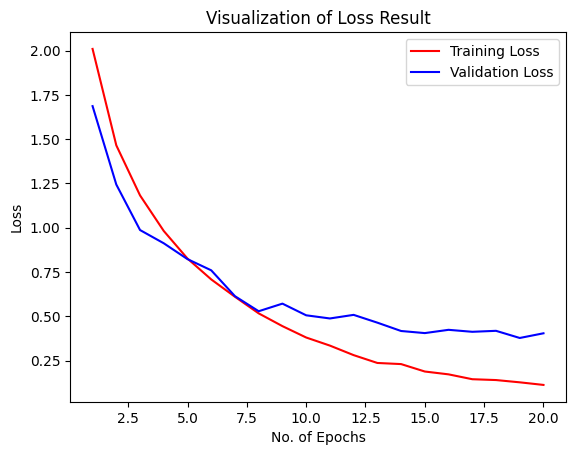

In [131]:
epochs = [i for i in range(1,21)]
plt.plot(epochs,training_history_data['loss'],label="Training Loss",color='red')
plt.plot(epochs,training_history_data['val_loss'],label="Validation Loss",color='blue')
plt.xlabel("No. of Epochs")
plt.ylabel("Loss")
plt.title("Visualization of Loss Result")
plt.legend()
plt.show()

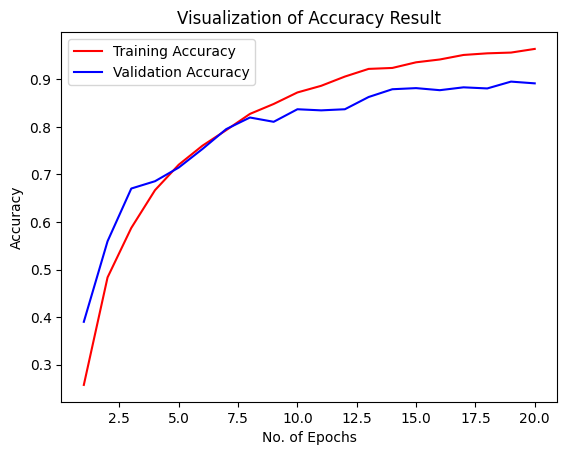

In [132]:
epochs = [i for i in range(1,21)]
plt.plot(epochs,training_history_data['accuracy'],label="Training Accuracy",color='red')
plt.plot(epochs,training_history_data['val_accuracy'],label="Validation Accuracy",color='blue')
plt.xlabel("No. of Epochs")
plt.ylabel("Accuracy")
plt.title("Visualization of Accuracy Result")
plt.legend()
plt.show()

<h2>9. Model Evaluation and Confusion Matrix Analysis<h2>

In this section, we evaluate the model's performance on the test set by generating predictions and comparing them with the true labels. We compute the confusion matrix and the classification report to obtain detailed metrics such as precision, recall, and F1-score for each class. Additionally, we visualize the confusion matrix using a heatmap to better understand the model’s strengths and weaknesses across different music genres.

In [133]:
X_test.shape

(2995, 150, 150, 1)

In [134]:
y_pred = model.predict(X_test)

94/94 ━━━━━━━━━━━━━━━━━━━━ 14s 153ms/step


In [135]:
y_pred

array([[6.3768059e-02, 2.5527846e-04, 1.7740637e-02, ..., 8.6235285e-01,
        1.4752308e-02, 1.4780663e-02],
       [4.9086122e-09, 9.1596635e-15, 3.2653103e-12, ..., 1.3114906e-14,
        2.7566515e-12, 3.0857710e-09],
       [4.2578230e-09, 2.1267198e-12, 3.8202972e-11, ..., 8.4092707e-12,
        2.8728333e-13, 4.1027511e-06],
       ...,
       [9.9991298e-01, 3.7823913e-13, 8.4277453e-08, ..., 8.2845016e-11,
        1.6797919e-11, 2.6068714e-09],
       [2.7777683e-03, 9.6515989e-01, 2.9315474e-03, ..., 3.1586036e-03,
        7.8719109e-03, 2.0982604e-03],
       [2.0071112e-03, 1.6868482e-07, 8.4829517e-04, ..., 3.0045363e-04,
        1.8847741e-02, 1.1214768e-02]], dtype=float32)

In [136]:
y_pred.shape

(2995, 10)

In [137]:
predicted_categories = np.argmax(y_pred,axis=1)

In [138]:
predicted_categories

array([7, 6, 6, ..., 0, 1, 4])

In [139]:
Y_test

array([[0., 0., 0., ..., 1., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [1., 0., 0., ..., 0., 0., 0.],
       [0., 1., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [140]:
Y_test.shape

(2995, 10)

In [141]:
true_categories = np.argmax(Y_test,axis=1)
true_categories

array([7, 6, 6, ..., 0, 1, 4])

In [142]:
classes

['blues',
 'classical',
 'country',
 'disco',
 'hiphop',
 'jazz',
 'metal',
 'pop',
 'reggae',
 'rock']

In [144]:
from sklearn.metrics import confusion_matrix,classification_report
cm = confusion_matrix(true_categories,predicted_categories)
print(classification_report(true_categories,predicted_categories,target_names=classes))

              precision    recall  f1-score   support

       blues       0.81      0.92      0.86       302
   classical       0.93      0.98      0.96       298
     country       0.83      0.84      0.83       317
       disco       0.89      0.91      0.90       312
      hiphop       0.95      0.95      0.95       277
        jazz       0.90      0.92      0.91       311
       metal       0.95      0.96      0.95       302
         pop       0.90      0.81      0.85       289
      reggae       0.90      0.89      0.90       296
        rock       0.87      0.74      0.80       291

    accuracy                           0.89      2995
   macro avg       0.89      0.89      0.89      2995
weighted avg       0.89      0.89      0.89      2995



In [145]:
cm

array([[279,   0,   6,   3,   0,   9,   0,   1,   2,   2],
       [  2, 292,   0,   0,   0,   3,   0,   1,   0,   0],
       [ 15,   1, 265,   6,   0,  12,   0,   5,   3,  10],
       [  2,   2,   1, 285,   3,   0,   0,   3,   8,   8],
       [  1,   0,   1,   2, 262,   0,   2,   7,   2,   0],
       [  5,  10,   6,   0,   0, 287,   0,   0,   2,   1],
       [  3,   0,   3,   0,   2,   2, 289,   0,   0,   3],
       [  9,   5,   9,  12,   6,   2,   0, 233,   7,   6],
       [ 14,   1,   5,   4,   1,   1,   0,   4, 264,   2],
       [ 14,   2,  23,  10,   1,   2,  14,   6,   5, 214]])

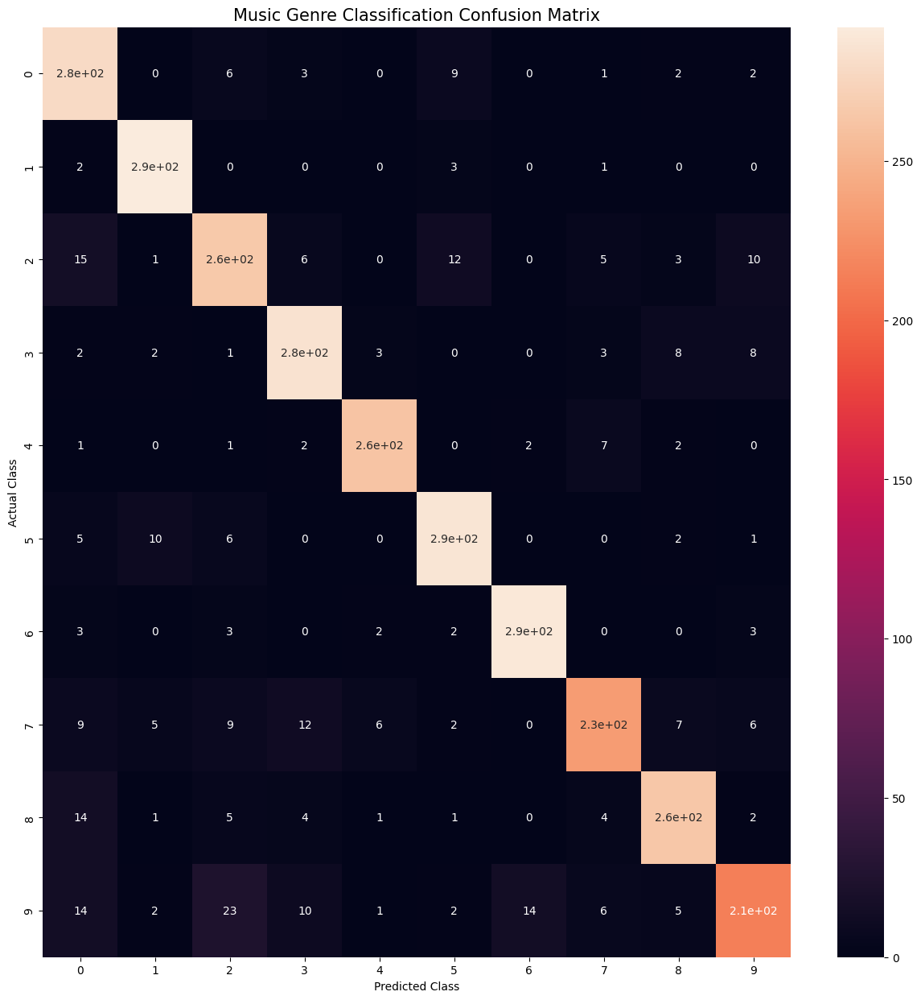

In [147]:
!pip install seaborn
import seaborn as sns
plt.figure(figsize=(15,15))
sns.heatmap(cm,annot=True,annot_kws={"size":10})
plt.xlabel("Predicted Class",fontsize=10)
plt.ylabel("Actual Class",fontsize=10)
plt.title("Music Genre Classification Confusion Matrix",fontsize=15)
plt.show()

<h2>10. Processing and Predicting Audio Classes from GTZAN Dataset<h2>

In [149]:
def load_and_preprocess_data(data_dir, classes, target_shape=(150,150)):
    data = []
    labels = []

    for i_class, class_name in enumerate(classes):
        class_dir = os.path.join(data_dir, class_name)
        print("Processing--", class_name)
        for filename in os.listdir(class_dir):
            if filename.endswith('.wav'):
                file_path = os.path.join(class_dir, filename)
                try:
                    audio_data, sample_rate = librosa.load(file_path, sr=None)
                except Exception as e:
                    warnings.warn(f"Error loading {file_path}: {e}")
                    continue
                chunk_duration = 4
                overlap_duration = 2
                chunk_samples = chunk_duration * sample_rate
                overlap_samples = overlap_duration * sample_rate
                num_chunks = int(np.ceil((len(audio_data) - chunk_samples) / (chunk_samples - overlap_samples))) + 1
                for i in range(num_chunks):
                    start = i * (chunk_samples - overlap_samples)
                    end = start + chunk_samples
                    chunk = audio_data[start:end]
                    mel_spectrogram = librosa.feature.melspectrogram(y=chunk, sr=sample_rate)
                    mel_spectrogram = resize(np.expand_dims(mel_spectrogram, axis=-1), target_shape, preserve_range=True)
                    data.append(mel_spectrogram)
                    labels.append(i_class)
    return np.array(data), np.array(labels)

In [151]:
from IPython.display import Audio
import librosa
file_path = r"C:\Users\nadiv\Downloads\GTZAN\pop.00069.wav"
y, sr = librosa.load(file_path, sr=44100)
Audio(data=y, rate=sr)

In [156]:
import numpy as np
import librosa
from skimage.transform import resize

file_path = r"C:\Users\nadiv\Downloads\GTZAN\pop.00069.wav"
y, sr = librosa.load(file_path, sr=None)

chunk_duration = 4
chunk_samples = chunk_duration * sr

if len(y) < chunk_samples:
    y = np.pad(y, (0, chunk_samples - len(y)))
else:
    y = y[:chunk_samples]

mel_spectrogram = librosa.feature.melspectrogram(y=y, sr=sr)

mel_spectrogram = resize(np.expand_dims(mel_spectrogram, axis=-1), (150, 150), preserve_range=True)

input_data = np.expand_dims(mel_spectrogram, axis=0)

predictions = model.predict(input_data)

predicted_class_index = np.argmax(predictions)
predicted_class = classes[predicted_class_index]

print(f"The predicted class is: {predicted_class}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
The predicted class is: pop


In [164]:
import os
import numpy as np
import librosa
from skimage.transform import resize

def predict_audio(file_path):
    y, sr = librosa.load(file_path, sr=None)

    chunk_duration = 4
    chunk_samples = chunk_duration * sr

    if len(y) < chunk_samples:
        y = np.pad(y, (0, chunk_samples - len(y)))
    else:
        y = y[:chunk_samples]

    mel_spectrogram = librosa.feature.melspectrogram(y=y, sr=sr)

    mel_spectrogram = resize(np.expand_dims(mel_spectrogram, axis=-1), (150, 150), preserve_range=True)

    input_data = np.expand_dims(mel_spectrogram, axis=0)

    predictions = model.predict(input_data)

    predicted_class_index = np.argmax(predictions)
    predicted_class = classes[predicted_class_index]

    return predicted_class

genres_dir = r'C:\Users\nadiv\Downloads\GTZAN\genres_original'

for genre_folder in os.listdir(genres_dir):
    genre_path = os.path.join(genres_dir, genre_folder)

    if os.path.isdir(genre_path):
        print(f"Procesando el género: {genre_folder}")

        count = 0
        for filename in os.listdir(genre_path):
            if filename.endswith('.wav') and count < 5:
                file_path = os.path.join(genre_path, filename)

                try:
                    predicted_class = predict_audio(file_path)
                    print(f"{filename} -> Predicción: {predicted_class}")
                    count += 1
                except Exception as e:
                    print(f"Error procesando {filename}: {e}")

Procesando el género: blues
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
blues.00000.wav -> Predicción: blues
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
blues.00001.wav -> Predicción: blues
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
blues.00002.wav -> Predicción: blues
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
blues.00003.wav -> Predicción: blues
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
blues.00004.wav -> Predicción: blues
Procesando el género: classical
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
classical.00000.wav -> Predicción: classical
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
classical.00001.wav -> Predicción: classical
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
classical.00002.wav -> Predicción: classical
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
classical.00003.wav -> Predicción: classical
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
classical.00004.wav -> Predicción: classical
Procesando el género: country
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
country.00000.wav -> Predicción: country
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
cou